#Part A

In [25]:
pip install pandas geopandas matplotlib contextily folium


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 14.1 MB/s eta 0:00:00


In [1]:
pip install dash pandas plotly


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 27.5 MB/s eta 0:00:00


In [2]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import pandas as pd
import plotly.express as px

# Sample Data (Replace with actual data loading)
df = pd.read_csv('zomato_df_final_data.csv')

# Data Preprocessing
# Handling Cuisine and Type (assuming list-like data is stored as strings)
df['cuisine'] = df['cuisine'].apply(lambda x: eval(x) if isinstance(x, str) else x)
df['type'] = df['type'].apply(lambda x: eval(x) if isinstance(x, str) else x)

# 1. Unique cuisines served
all_cuisines = df['cuisine'].explode().dropna().unique()

# 2. Top 3 suburbs with the highest number of restaurants
top_suburbs = df['subzone'].value_counts().nlargest(3)

# 3. Cost vs Rating Analysis
# Create bins for cost for better visualization
df['cost_bin'] = pd.cut(df['cost'], bins=[0, 25, 50, 75, 100, 150, 200, 300], labels=['0-25', '26-50', '51-75', '76-100', '101-150', '151-200', '201-300'])

# Start the Dash app
app = dash.Dash(__name__)

app.layout = html.Div([
    html.H1("Sydney Restaurants Dashboard"),

    # Cuisine Dropdown and Bar Chart
    html.Div([
        html.H2("Unique Cuisines in Sydney Restaurants"),
        dcc.Dropdown(
            id='cuisine_dropdown',
            options=[{'label': cuisine, 'value': cuisine} for cuisine in all_cuisines],
            value=all_cuisines[0],
            multi=True
        ),
        dcc.Graph(id='cuisine_bar_chart'),
    ]),

    # Top 3 Suburbs with the Highest Number of Restaurants
    html.Div([
        html.H2("Top 3 Suburbs with Highest Number of Restaurants"),
        dcc.Graph(
            figure=px.bar(top_suburbs, x=top_suburbs.index, y=top_suburbs.values, labels={'x': 'Suburb', 'y': 'Number of Restaurants'})
        ),
    ]),

    # Cost vs Rating (Stacked Bar Chart or Histogram)
    html.Div([
        html.H2("Cost vs Rating"),
        dcc.Graph(id='cost_rating_histogram')
    ]),

    # Exploratory Analysis: Cost, Rating, Type
    html.Div([
        html.H2("Exploratory Analysis"),

        # Cost Distribution
        html.H3("Cost Distribution"),
        dcc.Graph(
            figure=px.histogram(df, x='cost', nbins=20, title="Cost Distribution")
        ),

        # Rating Distribution
        html.H3("Rating Distribution"),
        dcc.Graph(
            figure=px.histogram(df, x='rating_number', nbins=10, title="Rating Distribution")
        ),

        # Restaurant Type Distribution
        html.H3("Restaurant Type Distribution"),
        dcc.Graph(
            figure=px.bar(df['type'].explode().value_counts(), labels={'index': 'Type', 'value': 'Count'}, title="Restaurant Type Distribution")
        ),
    ])
])

# Callback for Cuisine Bar Chart
@app.callback(
    Output('cuisine_bar_chart', 'figure'),
    [Input('cuisine_dropdown', 'value')]
)
def update_cuisine_chart(selected_cuisines):
    if isinstance(selected_cuisines, str):
        selected_cuisines = [selected_cuisines]

    cuisine_data = df[df['cuisine'].apply(lambda x: any(c in selected_cuisines for c in x))]
    cuisine_count = cuisine_data['cuisine'].explode().value_counts()

    fig = px.bar(cuisine_count, x=cuisine_count.index, y=cuisine_count.values, labels={'x': 'Cuisine', 'y': 'Count'})
    return fig

# Callback for Cost vs Rating Histogram
@app.callback(
    Output('cost_rating_histogram', 'figure'),
    [Input('cost_rating_histogram', 'id')]  # No input needed, it's just a default rendering
)
def update_cost_rating_histogram(_):
    fig = px.histogram(df, x='cost_bin', color='rating_text', barmode='group', title="Cost vs Rating Text")
    return fig

if __name__ == '__main__':
    app.run_server(debug=True)


<IPython.core.display.Javascript object>

In [5]:
pip install geopandas pandas folium


In [9]:
print(sydney_geo.columns)


Index(['SSC_CODE', 'SSC_NAME', 'CONF_VALUE', 'SQKM', 'geometry'], dtype='object')


In [11]:
import geopandas as gpd
import pandas as pd
import folium
from folium.features import Choropleth
from folium import Map

# Step 1: Load Restaurant Data (replace with actual data)
df = pd.read_csv('zomato_df_final_data.csv')

# Preprocess Cuisine Data
df['cuisine'] = df['cuisine'].apply(lambda x: eval(x) if isinstance(x, str) else x)

# Step 2: Load Sydney GeoJSON Data
geojson_path = 'sydney.geojson'
sydney_geo = gpd.read_file(geojson_path)

# Step 3: Convert restaurant data to GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['lng'], df['lat']))

# Step 4: Spatial Join - Join restaurants with Sydney suburbs
# Ensure CRS (Coordinate Reference System) is the same
gdf.crs = sydney_geo.crs

# Perform the spatial join using the 'predicate' argument
restaurants_with_suburb = gpd.sjoin(gdf, sydney_geo, how='left', predicate='within')

# Step 5: Define function to create Cuisine Density Map
def create_cuisine_density_map(cuisine_type):
    # Filter restaurants serving the selected cuisine
    cuisine_data = restaurants_with_suburb[restaurants_with_suburb['cuisine'].apply(lambda x: cuisine_type in x if x else False)]

    # Group by 'SSC_NAME' (suburb name) and count the number of restaurants serving the selected cuisine
    cuisine_counts = cuisine_data.groupby('SSC_NAME').size().reset_index(name='restaurant_count')

    # Merge the counts with the Sydney geojson (using SSC_NAME as the common key)
    merged_geo = sydney_geo.merge(cuisine_counts, left_on='SSC_NAME', right_on='SSC_NAME', how='left')

    # Replace NaN values with 0 for areas with no restaurants serving this cuisine
    merged_geo['restaurant_count'].fillna(0, inplace=True)

    # Step 6: Create the Map
    m = Map(location=[-33.8688, 151.2093], zoom_start=11)  # Center map on Sydney

    # Add a choropleth layer
    Choropleth(
        geo_data=merged_geo,
        name='choropleth',
        data=merged_geo,
        columns=['SSC_NAME', 'restaurant_count'],
        key_on='feature.properties.SSC_NAME',
        fill_color='YlOrRd',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'{cuisine_type} Restaurant Density',
    ).add_to(m)

    # Add tooltips
    folium.GeoJson(
        merged_geo,
        name="Suburb Info",
        tooltip=folium.GeoJsonTooltip(fields=["SSC_NAME", "restaurant_count"],
                                      aliases=["Suburb", f'{cuisine_type} Restaurants'],
                                      localize=True)
    ).add_to(m)

    # Display the map
    return m

# Step 7: Call the function for a specific cuisine type (e.g., Thai)
cuisine_map = create_cuisine_density_map('Thai')

# Save map to an HTML file
cuisine_map


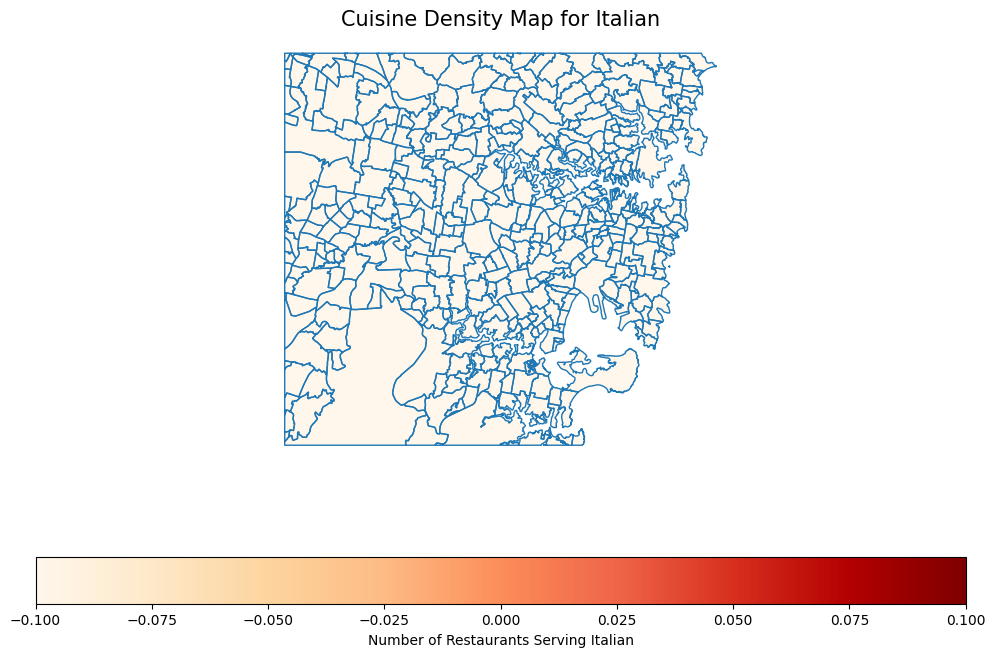

In [27]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

def create_cuisine_density_map(restaurant_data_path, geojson_path, cuisine_type):
    # Load the restaurant data
    df = pd.read_csv(restaurant_data_path)

    # Ensure that the restaurant dataframe has latitude and longitude
    if 'lat' not in df.columns or 'lng' not in df.columns:
        raise ValueError("The restaurant data must include 'lat' and 'lng' columns.")

    # Create a GeoDataFrame from the restaurant data
    gdf_restaurants = gpd.GeoDataFrame(
        df, geometry=gpd.points_from_xy(df.lng, df.lat)
    )

    # Load the GeoJSON file
    gdf_suburbs = gpd.read_file(geojson_path)

    # Count the number of restaurants per suburb for the specified cuisine
    cuisine_counts = gdf_restaurants[gdf_restaurants['cuisine'] == cuisine_type].groupby('subzone').size()

    # Merge the counts with the GeoDataFrame of suburbs
    gdf_suburbs = gdf_suburbs.merge(cuisine_counts.rename('cuisine_count'), left_on='SSC_NAME', right_index=True, how='left')

    # Fill NaN values with 0 (suburbs without restaurants of the specified cuisine)
    gdf_suburbs['cuisine_count'].fillna(0, inplace=True)

    # Plotting
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    gdf_suburbs.boundary.plot(ax=ax, linewidth=1)
    gdf_suburbs.plot(column='cuisine_count', ax=ax, legend=True,
                     legend_kwds={'label': "Number of Restaurants Serving " + cuisine_type,
                                  'orientation': "horizontal"},
                     cmap='OrRd', missing_kwds={'color': 'lightgrey', 'label': 'No Data'})

    ax.set_title(f"Cuisine Density Map for {cuisine_type}", fontsize=15)
    ax.set_axis_off()

    plt.show()

# Example usage
create_cuisine_density_map('sydney_restaurants.csv', 'sydney.geojson', 'Italian')


#Part B

In [17]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Load the dataset
df = pd.read_csv('sydney_restaurants.csv')

df.head()

,address,cost,cuisine,lat,link,lng,phone,rating_number,rating_text,subzone,title,type,votes,groupon,color,cost_2,cuisine_color
0,"371A Pitt Street, CBD, Sydney",50.0,"['Hot Pot', 'Korean BBQ', 'BBQ', 'Korean']",-33.876059,https://www.zomato.com/sydney/sydney-madang-cbd,151.207605,02 8318 0406,4.0,Very Good,CBD,Sydney Madang,['Casual Dining'],1311.0,False,#e15307,5.243902,#6f706b
1,"Shop 7A, 2 Huntley Street, Alexandria, Sydney",80.0,"['Cafe', 'Coffee and Tea', 'Salad', 'Poké']",-33.910999,https://www.zomato.com/sydney/the-grounds-of-a...,151.193793,02 9699 2225,4.6,Excellent,"The Grounds of Alexandria, Alexandria",The Grounds of Alexandria Cafe,['Café'],3236.0,False,#9c3203,7.560976,#6f706b
2,"Level G, The Darling at the Star, 80 Pyrmont ...",120.0,['Japanese'],-33.867971,https://www.zomato.com/sydney/sokyo-pyrmont,151.195210,1800 700 700,4.9,Excellent,"The Star, Pyrmont",Sokyo,['Fine Dining'],1227.0,False,#7f2704,10.650407,#6f706b
3,"Sydney Opera House, Bennelong Point, Circular...",270.0,['Modern Australian'],-33.856784,https://www.zomato.com/sydney/bennelong-restau...,151.215297,02 9240 8000,4.9,Excellent,Circular Quay,Bennelong Restaurant,"['Fine Dining', 'Bar']",278.0,False,#7f2704,22.235772,#4186f4
4,"20 Campbell Street, Chinatown, Sydney",55.0,"['Thai', 'Salad']",-33.879035,https://www.zomato.com/sydney/chat-thai-chinatown,151.206409,02 8317 4811,4.5,Excellent,Chinatown,Chat Thai,['Casual Dining'],2150.0,False,#a83703,5.630081,#6f706b


In [18]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error, confusion_matrix, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

# Load the dataset
df = pd.read_csv('sydney_restaurants.csv')

# Step 1: Data Cleaning - Drop rows with missing values (alternatively, you can choose to impute values)
df_cleaned = df.dropna()

# Step 2: Label/Feature Encoding
# Encoding 'rating_text' into numeric values for regression
rating_encoder = LabelEncoder()
df_cleaned['rating_text_encoded'] = rating_encoder.fit_transform(df_cleaned['rating_text'])

# OneHotEncoding for 'type' (since it can have multiple categories)
df_cleaned = df_cleaned.join(pd.get_dummies(df_cleaned['type'], prefix='type', drop_first=True))

# Step 3: Prepare features (X) and target (y) for regression
X_reg = df_cleaned[['cost', 'votes'] + [col for col in df_cleaned.columns if 'type_' in col]]
y_rating = df_cleaned['rating_number']  # For regression task (numeric rating)

# Step 4: Split the data into train (80%) and test (20%) sets for regression
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(X_reg, y_rating, test_size=0.2, random_state=0)

# Step 5: Build Linear Regression Model
model_regression_1 = LinearRegression()
model_regression_1.fit(X_train_reg, y_train_reg)

# Predict on test data
y_pred_regression_1 = model_regression_1.predict(X_test_reg)

# Calculate Mean Square Error (MSE) for the first regression model
mse_regression_1 = mean_squared_error(y_test_reg, y_pred_regression_1)
print(f"MSE for Linear Regression Model 1: {mse_regression_1}")

# Step 6: Build another Linear Regression Model using Gradient Descent
from sklearn.linear_model import SGDRegressor

model_regression_2 = SGDRegressor()
model_regression_2.fit(X_train_reg, y_train_reg)

# Predict on test data
y_pred_regression_2 = model_regression_2.predict(X_test_reg)

# Calculate Mean Square Error (MSE) for the second regression model
mse_regression_2 = mean_squared_error(y_test_reg, y_pred_regression_2)
print(f"MSE for Linear Regression Model 2 (SGD): {mse_regression_2}")

# Step 7: Binary Classification
# Simplifying the problem into binary classifications
df_cleaned['rating_binary'] = df_cleaned['rating_text'].apply(lambda x: 1 if x in ['Good', 'Very Good', 'Excellent'] else 0)

# Prepare features (X) and target (y) for classification
X_class = df_cleaned[['cost', 'votes'] + [col for col in df_cleaned.columns if 'type_' in col]]
y_class = df_cleaned['rating_binary']

# Split the data into train (80%) and test (20%) sets for classification
X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(X_class, y_class, test_size=0.2, random_state=0)

# Step 8: Build Logistic Regression Model
model_classification_3 = LogisticRegression(max_iter=1000)
model_classification_3.fit(X_train_class, y_train_class)

# Predict on test data
y_pred_classification_3 = model_classification_3.predict(X_test_class)

# Step 9: Confusion Matrix and Classification Report
conf_matrix = confusion_matrix(y_test_class, y_pred_classification_3)
class_report = classification_report(y_test_class, y_pred_classification_3)
print("Confusion Matrix:\n", conf_matrix)
print("Classification Report:\n", class_report)

# Step 10: Additional Classification Models
# Random Forest Classifier
model_rf = RandomForestClassifier()
model_rf.fit(X_train_class, y_train_class)
y_pred_rf = model_rf.predict(X_test_class)
print("Random Forest Classifier Report:\n", classification_report(y_test_class, y_pred_rf))

# Support Vector Classifier
model_svc = SVC()
model_svc.fit(X_train_class, y_train_class)
y_pred_svc = model_svc.predict(X_test_class)
print("SVC Report:\n", classification_report(y_test_class, y_pred_svc))

# K-Nearest Neighbors Classifier
model_knn = KNeighborsClassifier()
model_knn.fit(X_train_class, y_train_class)
y_pred_knn = model_knn.predict(X_test_class)
print("KNN Report:\n", classification_report(y_test_class, y_pred_knn))


<ipython-input-18-716f9d9fa511>:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



MSE for Linear Regression Model 1: 0.1580913188485946
MSE for Linear Regression Model 2 (SGD): 9.253788786701772e+25
Confusion Matrix:
 [[856  56]
 [168 310]]
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.94      0.88       912
           1       0.85      0.65      0.73       478

    accuracy                           0.84      1390
   macro avg       0.84      0.79      0.81      1390
weighted avg       0.84      0.84      0.83      1390

Random Forest Classifier Report:
               precision    recall  f1-score   support

           0       0.87      0.87      0.87       912
           1       0.75      0.74      0.75       478

    accuracy                           0.83      1390
   macro avg       0.81      0.81      0.81      1390
weighted avg       0.83      0.83      0.83      1390

SVC Report:
               precision    recall  f1-score   support

           0       0.89      0.90      0.89       912
       

In [24]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDRegressor
from sklearn.metrics import mean_squared_error, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import ColumnDataSource, ColorBar
from bokeh.transform import linear_cmap
from bokeh.layouts import column
from bokeh.transform import transform
from bokeh.models import LinearColorMapper

# Enable Bokeh in Jupyter Notebook
output_notebook()

# Load the dataset
df = pd.read_csv('sydney_restaurants.csv')

# Data Cleaning
df_cleaned = df.dropna()

# Label/Feature Encoding
rating_encoder = LabelEncoder()
df_cleaned['rating_text_encoded'] = rating_encoder.fit_transform(df_cleaned['rating_text'])
df_cleaned['rating_binary'] = df_cleaned['rating_text'].apply(lambda x: 1 if x in ['Good', 'Very Good', 'Excellent'] else 0)

# Prepare for Regression
X_reg = df_cleaned[['cost', 'votes']]
y_rating = df_cleaned['rating_number']

# Split for Regression
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(X_reg, y_rating, test_size=0.2, random_state=0)

# Regression Models
model_regression_1 = LinearRegression()
model_regression_1.fit(X_train_reg, y_train_reg)
y_pred_regression_1 = model_regression_1.predict(X_test_reg)
mse_regression_1 = mean_squared_error(y_test_reg, y_pred_regression_1)

model_regression_2 = SGDRegressor()
model_regression_2.fit(X_train_reg, y_train_reg)
y_pred_regression_2 = model_regression_2.predict(X_test_reg)
mse_regression_2 = mean_squared_error(y_test_reg, y_pred_regression_2)

# Prepare for Classification
X_class = df_cleaned[['cost', 'votes']]
y_class = df_cleaned['rating_binary']

# Split for Classification
X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(X_class, y_class, test_size=0.2, random_state=0)

# Classification Models
model_classification_3 = LogisticRegression(max_iter=1000)
model_classification_3.fit(X_train_class, y_train_class)
y_pred_classification_3 = model_classification_3.predict(X_test_class)

model_rf = RandomForestClassifier()
model_rf.fit(X_train_class, y_train_class)
y_pred_rf = model_rf.predict(X_test_class)

model_svc = SVC()
model_svc.fit(X_train_class, y_train_class)
y_pred_svc = model_svc.predict(X_test_class)

model_knn = KNeighborsClassifier()
model_knn.fit(X_train_class, y_train_class)
y_pred_knn = model_knn.predict(X_test_class)

# Compute confusion matrices
cm_logistic = confusion_matrix(y_test_class, y_pred_classification_3)
cm_rf = confusion_matrix(y_test_class, y_pred_rf)
cm_svc = confusion_matrix(y_test_class, y_pred_svc)
cm_knn = confusion_matrix(y_test_class, y_pred_knn)

# Prepare data for Bokeh confusion matrix heatmaps
def create_heatmap(cm, title):
    # Create a heatmap
    mapper = LinearColorMapper(palette='Viridis256', low=0, high=np.max(cm))

    source = ColumnDataSource(data=dict(
        x=['Predicted Poor', 'Predicted Good'],
        y=['Actual Poor', 'Actual Good'],
        values=cm.flatten()
    ))

    plot = figure(title=title, x_range=['Predicted Poor', 'Predicted Good'],
                  y_range=['Actual Poor', 'Actual Good'],
                  toolbar_location=None, tools="",
                  x_axis_location="below")

    plot.rect(x='x', y='y', width=0.9, height=0.9, source=source,
              fill_color=transform('values', mapper), line_color=None)

    plot.xgrid.grid_line_color = None
    plot.ygrid.grid_line_color = None
    plot.yaxis.axis_label = "Actual"
    plot.xaxis.axis_label = "Predicted"

    color_bar = ColorBar(color_mapper=mapper, location=(0, 0))
    plot.add_layout(color_bar, 'right')

    return plot

# Create heatmaps for confusion matrices
heatmap_logistic = create_heatmap(cm_logistic, "Logistic Regression Confusion Matrix")
heatmap_rf = create_heatmap(cm_rf, "Random Forest Confusion Matrix")
heatmap_svc = create_heatmap(cm_svc, "SVC Confusion Matrix")
heatmap_knn = create_heatmap(cm_knn, "KNN Confusion Matrix")

# Create Bokeh Figures for MSE and Accuracy
mse_data = {
    'models': ['Linear Regression 1', 'Linear Regression 2'],
    'MSE': [mse_regression_1, mse_regression_2]
}

accuracy_data = {
    'models': ['Logistic Regression', 'Random Forest', 'SVC', 'KNN'],
    'accuracy': [
        model_classification_3.score(X_test_class, y_test_class),
        model_rf.score(X_test_class, y_test_class),
        model_svc.score(X_test_class, y_test_class),
        model_knn.score(X_test_class, y_test_class)
    ]
}

# Create ColumnDataSource
source_mse = ColumnDataSource(data=mse_data)
source_accuracy = ColumnDataSource(data=accuracy_data)

# Create Bokeh Figures for MSE and Accuracy
mse_plot = figure(x_range=source_mse.data['models'], title="Mean Squared Error of Regression Models",
                  toolbar_location=None, tools="", y_axis_type="log")

mse_plot.vbar(x='models', top='MSE', source=source_mse, width=0.9, color="blue")
mse_plot.xgrid.grid_line_color = None
mse_plot.y_range.start = 0.01  # Start just above 0 for log scale
mse_plot.xaxis.axis_label = 'Models'
mse_plot.yaxis.axis_label = 'Mean Squared Error (Log Scale)'
mse_plot.yaxis.axis_label_standoff = 10
mse_plot.xaxis.axis_label_standoff = 10

accuracy_plot = figure(x_range=source_accuracy.data['models'], title="Accuracy of Classification Models",
                       toolbar_location=None, tools="", y_range=(0, 1))

accuracy_plot.vbar(x='models', top='accuracy', source=source_accuracy, width=0.9, color="green")
accuracy_plot.xgrid.grid_line_color = None
accuracy_plot.y_range.start = 0  # Start just above 0
accuracy_plot.y_range.end = 1  # End at 1 for accuracy
accuracy_plot.xaxis.axis_label = 'Models'
accuracy_plot.yaxis.axis_label = 'Accuracy'
accuracy_plot.yaxis.axis_label_standoff = 10
accuracy_plot.xaxis.axis_label_standoff = 10

# Show all plots together
show(column(heatmap_logistic, heatmap_rf, heatmap_svc, heatmap_knn))


<ipython-input-24-eeab8ce3d13a>:29: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-24-eeab8ce3d13a>:30: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [19]:
pip install bokeh


In [22]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import ColumnDataSource
from bokeh.layouts import column

# Enable Bokeh in Jupyter Notebook
output_notebook()

# Load the dataset
df = pd.read_csv('sydney_restaurants.csv')

# Data Cleaning
df_cleaned = df.dropna()

# Label/Feature Encoding
rating_encoder = LabelEncoder()
df_cleaned['rating_text_encoded'] = rating_encoder.fit_transform(df_cleaned['rating_text'])
df_cleaned['rating_binary'] = df_cleaned['rating_text'].apply(lambda x: 1 if x in ['Good', 'Very Good', 'Excellent'] else 0)

# Prepare for Regression
X_reg = df_cleaned[['cost', 'votes']]
y_rating = df_cleaned['rating_number']

# Split for Regression
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(X_reg, y_rating, test_size=0.2, random_state=0)

# Regression Models
model_regression_1 = LinearRegression()
model_regression_1.fit(X_train_reg, y_train_reg)
y_pred_regression_1 = model_regression_1.predict(X_test_reg)
mse_regression_1 = mean_squared_error(y_test_reg, y_pred_regression_1)

model_regression_2 = SGDRegressor()
model_regression_2.fit(X_train_reg, y_train_reg)
y_pred_regression_2 = model_regression_2.predict(X_test_reg)
mse_regression_2 = mean_squared_error(y_test_reg, y_pred_regression_2)

# Prepare for Classification
X_class = df_cleaned[['cost', 'votes']]
y_class = df_cleaned['rating_binary']

# Split for Classification
X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(X_class, y_class, test_size=0.2, random_state=0)

# Classification Models
model_classification_3 = LogisticRegression(max_iter=1000)
model_classification_3.fit(X_train_class, y_train_class)
accuracy_classification_3 = model_classification_3.score(X_test_class, y_test_class)

model_rf = RandomForestClassifier()
model_rf.fit(X_train_class, y_train_class)
accuracy_rf = model_rf.score(X_test_class, y_test_class)

model_svc = SVC()
model_svc.fit(X_train_class, y_train_class)
accuracy_svc = model_svc.score(X_test_class, y_test_class)

model_knn = KNeighborsClassifier()
model_knn.fit(X_train_class, y_train_class)
accuracy_knn = model_knn.score(X_test_class, y_test_class)

# Prepare data for Bokeh plots
mse_data = {
    'models': ['Linear Regression 1', 'Linear Regression 2'],
    'MSE': [mse_regression_1, mse_regression_2]
}

accuracy_data = {
    'models': ['Logistic Regression', 'Random Forest', 'SVC', 'KNN'],
    'accuracy': [accuracy_classification_3, accuracy_rf, accuracy_svc, accuracy_knn]
}

# Create ColumnDataSource
source_mse = ColumnDataSource(data=mse_data)
source_accuracy = ColumnDataSource(data=accuracy_data)

# Create Bokeh Figures
mse_plot = figure(x_range=source_mse.data['models'], title="MSE of Regression Models",
                  toolbar_location=None, tools="")

mse_plot.vbar(x='models', top='MSE', source=source_mse, width=0.9, color="blue")
mse_plot.xgrid.grid_line_color = None
mse_plot.y_range.start = 0
mse_plot.xaxis.axis_label = 'Models'
mse_plot.yaxis.axis_label = 'Mean Squared Error'

accuracy_plot = figure(x_range=source_accuracy.data['models'], title="Accuracy of Classification Models",
                       toolbar_location=None, tools="")

accuracy_plot.vbar(x='models', top='accuracy', source=source_accuracy, width=0.9, color="green")
accuracy_plot.xgrid.grid_line_color = None
accuracy_plot.y_range.start = 0
accuracy_plot.xaxis.axis_label = 'Models'
accuracy_plot.yaxis.axis_label = 'Accuracy'

# Show the plots together
show(column(mse_plot, accuracy_plot))


<ipython-input-22-3d918eb6025d>:26: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-22-3d918eb6025d>:27: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

